In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import glob
import datetime
import seaborn as sns # Seaborn plotting style
from scipy.stats import linregress
from matplotlib.dates import DateFormatter
import sys
import os
script_dir = '../EcoV2'
sys.path.append(os.path.abspath(script_dir))
# from EcoRevCore import ecoRead
sns.set_style("darkgrid")

In [37]:
fpath = '../Data/B206/'
skip = 1
suffix = '.csv'

# 2020-09-12
froot = 'Bouss_09_12_2020_'
# # SELECT: ascent or descent
# updown = 'asc'
updown='desc'

# 2021-02-26
fpath = '../Data/Poteau-2021-02-26/'
froot = 'b225'
# froot = 'b227'
froot = 'rade'
# SELECT: ascent or descent 1,2,3
# updown = '_asc3'
updown = '_desc1'  

# 2021-02-26
# names = 'pres','time','temp','conductivity','sbeox0v','fluo_chl','upoly0','upoly1','potemp','sal00','sigma','sbeox_ml','sbeox_mm','flag','second','day_name','month','day','year','fluo_flbb','bb700','cdom','echov1','fluo_440','fluo_470','fluo_532','echo3x','frame_sync','counter','chl_hi_gain_counts','chl_lo_gain_counts','chl_ltc_counts','chl_raw_counts','beta_700_hi_gain_counts','beta_700_lo_gain_counts','beta_700_ltc_counts','beta_700_raw_counts','chl2_hi_gain_counts','chl2_lo_gain_counts','chl2_ltc_counts','chl2_raw_counts','fdom_hi_gain_counts','fdom_lo_gain_counts','fdom_ltc_counts','fdom_raw_counts','v_main_volts','date'

# Calibration Coefficients

# ECO V1 SN 52147
EcoV1_chl_470_slope = 0.0073
EcoV1_chl_470_dark = 45

# ECO V1 SN 52147
# E3x1m_chl_440_slope = 0.0073
# E3x1m_chl_440_dark = 47
E3x1m_chl_470_slope = 0.0073
E3x1m_chl_470_dark = 49
# E3x1m_chl_532_slope = 0.0073
# E3x1m_chl_532_dark = 50

# Eco.V2 B206
b206_chl_470_slope = 0.004336614
b206_chl_470_dark = 52
b206_chl_440_slope = 0.00713441
b206_chl_440_dark = 55

# Read the eco data
# fn = fpath+froot+dir+'_ecov2.csv'
fn = fpath+froot+updown+suffix
print(fn)
df = pd.read_csv(fn, sep=',', header=0)

df['dir'] = updown
dfeco = df.dropna(subset=['fluo_flbb']).copy()
dfctd = df.dropna(subset=['temp']).copy()

dfeco['chl_470_v2']  = (dfeco['chl_hi_gain_counts'] - b206_chl_470_dark)*b206_chl_470_slope
dfeco['chl_440_v2']  = (dfeco['chl2_hi_gain_counts'] - b206_chl_440_dark)*b206_chl_440_slope
dfeco['chl_440_adjusted']  = (dfeco['chl_hi_gain_counts'] - b206_chl_440_dark)*b206_chl_440_slope/1.426
dfeco['chl_470_flbb'] = (dfeco['fluo_flbb'] - EcoV1_chl_470_dark)*EcoV1_chl_470_slope
dfeco['chl_470_3x1m'] = (dfeco['fluo_470']  - E3x1m_chl_470_dark)*E3x1m_chl_470_slope


../Data/Poteau-2021-02-26/rade_desc1.csv


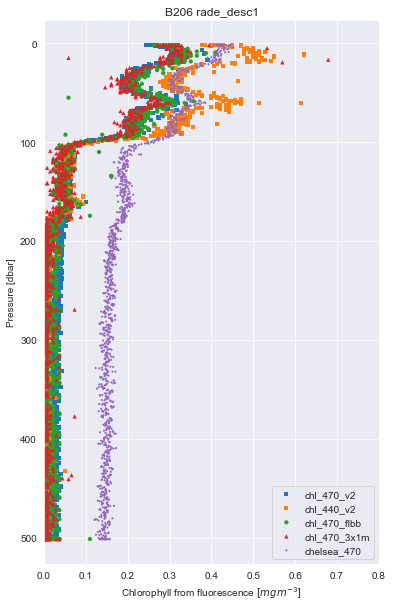

In [38]:
# Engineering Units Plots

# Channel names
ctd_470='fluo_chl'

# Chl-a
ecoV1_chl_470='chl_470_flbb'
ecoV2_chl_470='chl_470_v2'  
ecoV2_chl_440='chl_440_v2'  
# ecoV2_chl_440='chl_440_adjusted'  
e3x1m_chl_470='chl_470_3x1m'

# Counts
ecoV1_470='chl_flbb'
ecoV2_470='chl_hi_gain_counts'  
ecoV2_440='ch2_hi_gain_counts'  
e3x1m_470='fluo_470'  
e3x1m_440='fluo_440'  
e3x1m_532='fluo_532'  

# Plotting
fig = plt.figure(figsize=(6,10))

vars = [ecoV2_chl_470, ecoV2_chl_440, ecoV1_chl_470, e3x1m_chl_470]
marks  = ['s', 's', 'o', '^']

for varx,mark in zip(vars, marks) :
    h = sns.scatterplot(data=dfeco, x=varx,  y="pres", edgecolor='none', marker=mark, label=varx, size=1)
h = sns.scatterplot(data=dfctd, x=ctd_470,  y="pres", edgecolor='none', marker='.', label='chelsea_470', size=1)

axes=[]
axes.append(h.axes)
nax = 0
hl,l = axes[nax].get_legend_handles_labels()
plt.legend(hl[0:-1:2], l[0:-1:2])
axes[nax].invert_yaxis()
axes[nax].set_title('B206'+" "+froot+updown)
# axes[nax].set_title('B206'+" "+froot+updown+'adjusted')
# axes[nax].legend(labels=vars.append('fluo_chl'))
# axes[nax].set_title('B206'+" "+dir+' adjusted')
# axes[nax].legend(labels=[ecoV2_470, ecoV2_440+"/1.43", ctd_470])
axes[nax].set_xlabel(r'Chlorophyll from fluorescence $[mg m^{-3}]$')
axes[nax].set_ylabel('Pressure [dbar]')
axes[nax].set_xlim([0,0.8])


plt.show()

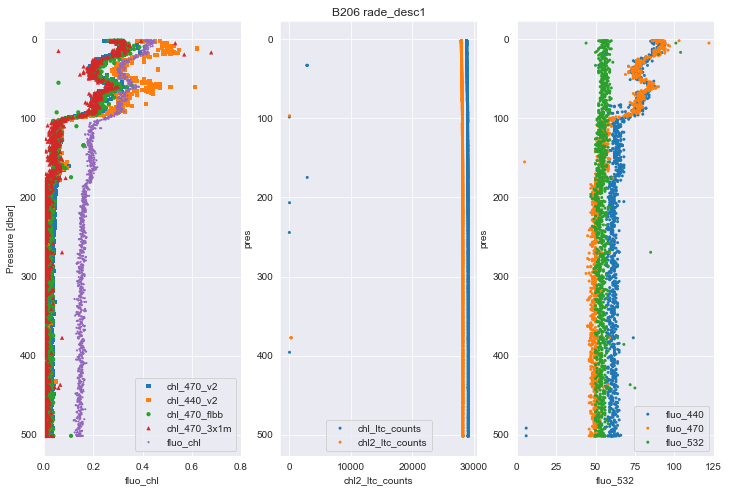

In [39]:
# Plot data in Engineering Units, LTC, Counts
# Channel names
ctd_470='fluo_chl'

ecoV1_chl_470='chl_470_flbb'
ecoV2_chl_470='chl_470_v2'  
ecoV2_chl_440='chl_440_v2'  
e3x1m_chl_470='chl_470_3x1m'

ecoV1_470='chl_flbb'
ecoV2_470='chl_470'  
ecoV2_440='chl_440'  
ecoV2_470_LTC='chl_ltc_counts'  
ecoV2_440_LTC='chl2_ltc_counts'  

e3x1m_470='chl_3x1m'
e3x1m_470='fluo_470'  
e3x1m_440='fluo_440'  
e3x1m_532='fluo_532'  

# Plotting
fig, axes = plt.subplots(1, 3, sharex=False, figsize=(12,8))

# CTD fluorometer + Eco.V2 B206
nax = 0
vars = [ecoV2_chl_470, ecoV2_chl_440, ecoV1_chl_470, e3x1m_chl_470]
marks  = ['s', 's', 'o', '^']

for varx,mark in zip(vars, marks) :
    h = sns.scatterplot(ax=axes[nax], data=dfeco, x=varx,  y="pres", edgecolor='none', marker=mark, label=varx, size=1)
h = sns.scatterplot(ax=axes[nax], data=dfctd, x=ctd_470,  y="pres", edgecolor='none', marker='.', label=ctd_470, size=1)

# B206 LTC (forward voltage) on Chl_470 and Chl_440 LEDs
nax = nax + 1
sns.scatterplot(ax=axes[nax], data=dfeco, x=ecoV2_470_LTC, y="pres", edgecolor='none', marker='.')
sns.scatterplot(ax=axes[nax], data=dfeco, x=ecoV2_440_LTC, y="pres", edgecolor='none', marker='.')

# Eco.V1 and Eco.3X1M
nax = nax + 1
# sns.scatterplot(ax=axes[nax], data=dfeco, x=ecoV1_470,  y="pres", edgecolor='none', marker='.')
sns.scatterplot(ax=axes[nax], data=dfeco, x=e3x1m_440,  y="pres", edgecolor='none', marker='.')
sns.scatterplot(ax=axes[nax], data=dfeco, x=e3x1m_470,  y="pres", edgecolor='none', marker='.')
sns.scatterplot(ax=axes[nax], data=dfeco, x=e3x1m_532,  y="pres", edgecolor='none', marker='.')
# sns.scatterplot(ax=axes[nax], data=dfctd, x="T",  y="pres", edgecolor='none', marker='.', color='r')
# ax2 = axes[nax].twiny()
# sns.scatterplot(ax=ax2, data=dfctd, x="S",  y="pres", edgecolor='none', marker='.')

nax = 0
hl,l = axes[nax].get_legend_handles_labels()
axes[nax].legend(hl[0:-1:2], l[0:-1:2])
axes[nax].invert_yaxis()
# axes[nax].set_title('B206 '+froot+updown)
# axes[nax].legend(labels=vars.append('fluo_chl'))
# axes[nax].set_title('B206'+" "+dir+' adjusted')
# axes[nax].legend(labels=[ecoV2_470, ecoV2_440+"/1.43", ctd_470])
axes[nax].set_ylabel('Pressure [dbar]')
axes[nax].set_xlim([0,0.8])

nax = nax + 1
axes[nax].invert_yaxis()
axes[nax].set_title('B206 '+ froot + updown)
axes[nax].legend(loc='lower center', labels=[ecoV2_470_LTC, ecoV2_440_LTC])

nax = nax + 1
# axes[nax].set_title('B206 '+froot+updown)
axes[nax].legend(labels=[e3x1m_440, e3x1m_470, e3x1m_532])
axes[nax].invert_yaxis()
axes[nax].set_xlim([0,125])


plt.show()

1.663423689547714 -0.037920139579932954 0.9825894021187024 0.0 0.014632989178770163


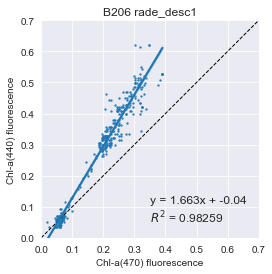

In [40]:
# Linear regression of Chl_440 vs. chl_470
varx = dfeco['chl_470_v2']
vary = dfeco['chl_440_v2']
mask = ~np.isnan(varx) & ~np.isnan(vary) & (vary >= 0.03) & (vary >= 0.03) & (varx < 0.7) & (vary < 0.7)
# mask = ~np.isnan(varx) & ~np.isnan(vary) 
varx = varx[mask]
vary = vary[mask]
slope, intercept, r_value, p_value, std_err = linregress(varx, vary)
print(slope, intercept, r_value, p_value, std_err)

# Plot it
h = plt.figure()

maxxy = 0.7
ax = sns.lineplot(x=[0,maxxy],y=[0, maxxy], color='k', linewidth=1)
ax.lines[0].set_linestyle("--")

ax = sns.regplot(x=varx, y=vary, scatter_kws={'s':2})
ax.set(xlabel='Chl-a(470) fluorescence', ylabel='Chl-a(440) fluorescence')

plt.axis('square')
plt.xlim([0,0.7])
plt.ylim([0,0.7])
yticks = ax.get_yticks()
ax.set_xticks(yticks)

x = maxxy/2; y = vary.iloc[-1]  # annotation coordinates
plt.annotate(f'y = {float(slope):.3f}x + {float(intercept):.2f}\n$R^2$ = {r_value:.5f}', xy=(x,y), fontsize=12)
plt.title('B206 '+froot+updown)
plt.show()

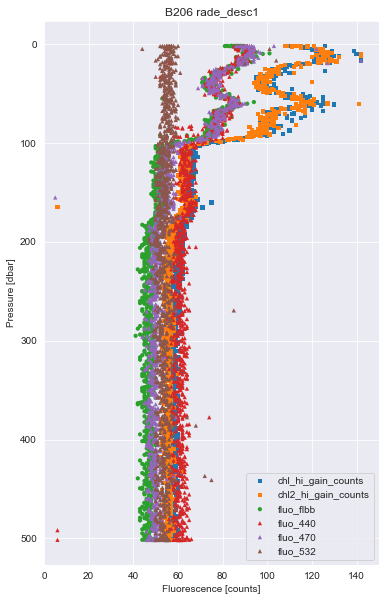

In [41]:
# Plot Chl Channel Counts
# ctd_470='fluo_chl'

ecoV1_470='fluo_flbb'
ecoV2_470='chl_hi_gain_counts'  
ecoV2_440='chl2_hi_gain_counts'  

e3x1m_470='fluo_470'
e3x1m_440='fluo_440'  
e3x1m_532='fluo_532'  

# Plotting
fig = plt.figure(figsize=(6,10))
#  Eco.V2 B206
vars = [ecoV2_470, ecoV2_440, ecoV1_470, e3x1m_440, e3x1m_470, e3x1m_532]
marks  = ['s', 's', 'o', '^', '^', '^']

for varx,mark in zip(vars, marks) :
    h = sns.scatterplot(data=dfeco, x=varx,  y="pres", edgecolor='none', marker=mark, size=1,  label=varx)

ax = h.axes
hl,l = h.get_legend_handles_labels()
plt.legend(hl[0:-1:2], l[0:-1:2])
# ax.set_ylim([0,25])
ax.invert_yaxis()
ax.set_title('B206 ' + froot + updown)
ax.set_xlabel('Fluorescence [counts]')
ax.set_ylabel('Pressure [dbar]')
ax.set_xlim([0,150])

plt.show()

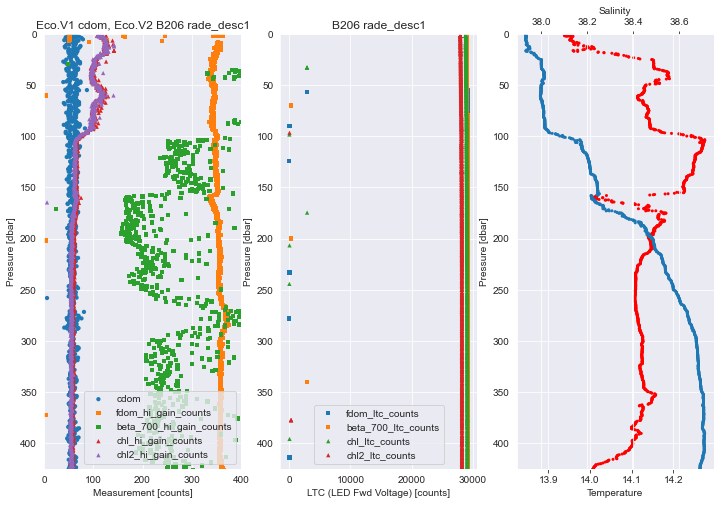

In [42]:
# Plot CDOM / FDOM / Chl / BB Channel Counts

ecoV1_cdom='cdom'
ecoV2_fdom='fdom_hi_gain_counts'  
ecoV2_bb700='beta_700_hi_gain_counts'  
ecoV2_470='chl_hi_gain_counts'  
ecoV2_440='chl2_hi_gain_counts'  

ecoV2_bb700_LTC='beta_700_ltc_counts'  
ecoV2_470_LTC='chl_ltc_counts'  
ecoV2_440_LTC='chl2_ltc_counts'  
ecoV2_fdom_LTC='fdom_ltc_counts'  

ylm = 425

# Plotting
fig, axes = plt.subplots(1, 3, sharex=False, figsize=(12,8))

#  Eco.V1, Eco.V2 B206 channel counts
vars = [ecoV1_cdom, ecoV2_fdom, ecoV2_bb700, ecoV2_470, ecoV2_440]
marks  = ['o', 's', 's', '^', '^']

nax = 0
for varx,mark in zip(vars, marks) :
    h = sns.scatterplot(ax=axes[nax], data=dfeco, x=varx,  y="pres", edgecolor='none', marker=mark, size = 1, label=varx)

ax = axes[nax]
hl,l = h.get_legend_handles_labels()
h.legend(hl[0:-1:2], l[0:-1:2])
ax.set_xlim([0,400])
ax.set_ylim([0,ylm])
ax.invert_yaxis()
ax.set_title('Eco.V1 cdom, Eco.V2 B206 '+ froot + updown)
ax.set_xlabel('Measurement [counts]')
ax.set_ylabel('Pressure [dbar]')

#  Eco.V1, Eco.V2 B206 LTC (LED fwd voltage) counts
nax = nax + 1
vars = [ecoV2_fdom_LTC, ecoV2_bb700_LTC, ecoV2_470_LTC, ecoV2_440_LTC]
marks  = ['s', 's', '^', '^']
for varx,mark in zip(vars, marks) :
    h = sns.scatterplot(ax=axes[nax], data=dfeco, x=varx,  y="pres", edgecolor='none', marker=mark, size=1,  label=varx)

ax = axes[nax]
hl,l = h.get_legend_handles_labels()
h.legend(hl[0:-1:2], l[0:-1:2])
# ax.set_xlim([0,150])
ax.set_ylim([0,ylm])
ax.invert_yaxis()
ax.set_title('B206 ' + froot + updown)
ax.set_xlabel('LTC (LED Fwd Voltage) [counts]')
ax.set_ylabel('Pressure [dbar]')

# T, S
nax = nax + 1
ax = axes[nax]
sns.scatterplot(ax=ax, data=dfctd, x="temp",  y="pres", edgecolor='none', marker='.', color='r')
ax2 = axes[nax].twiny()
sns.scatterplot(ax=ax2, data=dfctd, x="sal00",  y="pres", edgecolor='none', marker='.')

# ax.set_xlim([0,150])
ax.set_ylim([0,ylm])
ax.invert_yaxis()
ax.set_xlabel('Temperature')
ax2.set_xlabel('Salinity')
ax.set_ylabel('Pressure [dbar]')


plt.show()
